In [1]:
#some imports along with mxnet
%matplotlib inline
import mxnet as mx
import numpy as np 
import cv2
import matplotlib.pyplot as plt
import logging

logger = logging.getLogger()
logger.setLevel(logging.DEBUG)

num_px = 224
batch_size=64

In [13]:
import os
import scipy

pic_files = []
for _, _, files in os.walk('train'):
    pic_files.extend(files)
max_length = max([len(f.split('.')[1]) for f in pic_files])
index = 0
for pic_file in pic_files:
    if index % 1000 == 0:
        print 'processed %d pics' % index
    index += 1
    names = pic_file.split('.')
    new_pic_file =  ''.join(['0' for i in range(max_length-len(names[1]))]) + names[1] + '.jpg'
    image = np.array(scipy.misc.imread('train/'+pic_file, flatten=False))
    height, width, _ = image.shape
    if height > width:
        padding = (height - width) / 2
        image = np.pad(image, ((0,0), (padding,padding), (0,0)), 'constant', constant_values=0)
    else:
        padding = (width - height) / 2
        image = np.pad(image, ((padding,padding), (0,0), (0,0)), 'constant', constant_values=0)
    image = scipy.misc.imresize(image, size=(num_px,num_px))
    scipy.misc.imsave('train_pad_224x224/%s/%s' % (names[0], new_pic_file), image)

processed 0 pics
processed 1000 pics
processed 2000 pics
processed 3000 pics
processed 4000 pics
processed 5000 pics
processed 6000 pics
processed 7000 pics
processed 8000 pics
processed 9000 pics
processed 10000 pics
processed 11000 pics
processed 12000 pics
processed 13000 pics
processed 14000 pics
processed 15000 pics
processed 16000 pics
processed 17000 pics
processed 18000 pics
processed 19000 pics
processed 20000 pics
processed 21000 pics
processed 22000 pics
processed 23000 pics
processed 24000 pics


In [15]:
import os
import scipy

pic_files = []
for _, _, files in os.walk('test'):
    pic_files.extend(files)
max_length = max([len(f.split('.')[0]) for f in pic_files])
index = 0
for pic_file in pic_files:
    if index % 1000 == 0:
        print 'processed %d pics' % index
    index += 1
    names = pic_file.split('.')
    new_pic_file =  ''.join(['0' for i in range(max_length-len(names[0]))]) + names[0] + '.jpg'
    image = np.array(scipy.misc.imread('test/'+pic_file, flatten=False))
    height, width, _ = image.shape
    if height > width:
        padding = (height - width) / 2
        image = np.pad(image, ((0,0), (padding,padding), (0,0)), 'constant', constant_values=0)
    else:
        padding = (width - height) / 2
        image = np.pad(image, ((padding,padding), (0,0), (0,0)), 'constant', constant_values=0)
    image = scipy.misc.imresize(image, size=(num_px,num_px))
    scipy.misc.imsave('test_pad_224x224/%s' % new_pic_file, image)

processed 0 pics
processed 1000 pics
processed 2000 pics
processed 3000 pics
processed 4000 pics
processed 5000 pics
processed 6000 pics
processed 7000 pics
processed 8000 pics
processed 9000 pics
processed 10000 pics
processed 11000 pics
processed 12000 pics


In [2]:
train_iter = mx.io.ImageRecordIter(
      path_imgrec="./cats_dogs_train.rec",
      data_shape=(3, num_px, num_px), 
      batch_size=64,
      rand_crop=True, 
      rand_mirror =True
  )
val_iter = mx.io.ImageRecordIter(
      path_imgrec="./cats_dogs_val.rec",
      data_shape=(3, num_px, num_px), 
      batch_size=64,
      rand_crop=False, 
      rand_mirror =False
  )

In [5]:
sym, arg_params, aux_params = mx.model.load_checkpoint('Inception-BN', 126)
all_layers = sym.get_internals()
flatten  = all_layers['flatten_output']
fc1 = mx.sym.FullyConnected(data=flatten, num_hidden=2, name="fc1")
softmax = mx.sym.SoftmaxOutput(data=fc1, name='softmax')

model_prefix = 'models/chkpt'
checkpoint = mx.callback.do_checkpoint(model_prefix)
adam = mx.optimizer.create('adam')
init = mx.initializer.Xavier(rnd_type='gaussian', factor_type='avg')
mod = mx.mod.Module(symbol=softmax, context=mx.cpu())
new_args = dict({k:arg_params[k] for k in arg_params if 'fc1' not in k})
#mod.bind(for_training=True, data_shapes=[('data', (batch_size,3,num_px,num_px))])
#mod.init_params(initializer=init, arg_params=arg_params, aux_params=aux_params, allow_missing=True)

mod.fit(
    train_iter,
    eval_data=val_iter, 
    num_epoch = 10, 
    initializer=init,
    eval_metric='acc',
    kvstore='device',
    optimizer = adam,
    optimizer_params={'learning_rate':0.05},
    arg_params=new_args,
    aux_params=aux_params,
    allow_missing=True, 
    batch_end_callback=mx.callback.Speedometer(batch_size, 64),
    epoch_end_callback=checkpoint
)

/usr/lib/python2.7/site-packages/mxnet/module/base_module.py:466: UserWarning: Optimizer created manually outside Module but rescale_grad is not normalized to 1.0/batch_size/num_workers (1.0 vs. 0.015625). Is this intended?
  optimizer_params=optimizer_params)
INFO:root:Epoch[0] Batch [64]	Speed: 4.60 samples/sec	accuracy=0.942788
INFO:root:Epoch[0] Batch [128]	Speed: 4.51 samples/sec	accuracy=0.968994
INFO:root:Epoch[0] Batch [192]	Speed: 4.59 samples/sec	accuracy=0.971436
INFO:root:Epoch[0] Batch [256]	Speed: 4.52 samples/sec	accuracy=0.969727
INFO:root:Epoch[0] Train-accuracy=0.976842
INFO:root:Epoch[0] Time cost=4386.170
INFO:root:Saved checkpoint to "models/chkpt-0001.params"
INFO:root:Epoch[0] Validation-accuracy=0.899525
INFO:root:Epoch[1] Batch [64]	Speed: 4.55 samples/sec	accuracy=0.980288
INFO:root:Epoch[1] Batch [128]	Speed: 4.53 samples/sec	accuracy=0.980225
INFO:root:Epoch[1] Batch [192]	Speed: 4.59 samples/sec	accuracy=0.985352
INFO:root:Epoch[1] Batch [256]	Speed: 4.57 s

In [6]:
acc = mx.metric.Accuracy()
mod.score(val_iter, acc)
print acc

EvalMetric: {'accuracy': 0.9749599358974359}


In [2]:
# Load the model from the checkpoint , we are loading the 10 epoch
model_prefix = 'models/chkpt'
sym, arg_params, aux_params = mx.model.load_checkpoint(model_prefix, 15)

# Assign the loaded parameters to the module
mod = mx.mod.Module(symbol=sym, context=mx.cpu())
mod.bind(for_training=False, data_shapes=[('data', (1,3,num_px,num_px))])
mod.set_params(arg_params, aux_params)

/usr/lib/python2.7/site-packages/mxnet/module/base_module.py:65: UserWarning: Data provided by label_shapes don't match names specified by label_names ([] vs. ['softmax_label'])
  warnings.warn(msg)


In [3]:
# Load the model from the checkpoint , we are loading the 10 epoch
model_prefix = 'models/chkpt'
checkpoint = mx.callback.do_checkpoint(model_prefix)
sym, arg_params, aux_params = mx.model.load_checkpoint(model_prefix, 10)
mod = mx.mod.Module(symbol=sym)
mod.fit(
    train_iter,
    eval_data=val_iter, 
    num_epoch = 15, 
    begin_epoch=10,
    arg_params=arg_params,
    aux_params=aux_params,
    batch_end_callback=mx.callback.Speedometer(batch_size, 64),
    epoch_end_callback=checkpoint
)

INFO:root:Epoch[10] Batch [64]	Speed: 4.62 samples/sec	accuracy=0.993990
INFO:root:Epoch[10] Batch [128]	Speed: 4.54 samples/sec	accuracy=0.993164
INFO:root:Epoch[10] Batch [192]	Speed: 4.47 samples/sec	accuracy=0.994629
INFO:root:Epoch[10] Batch [256]	Speed: 4.54 samples/sec	accuracy=0.997803
INFO:root:Epoch[10] Train-accuracy=0.998326
INFO:root:Epoch[10] Time cost=4397.093
INFO:root:Saved checkpoint to "models/chkpt-0011.params"
INFO:root:Epoch[10] Validation-accuracy=0.977453
INFO:root:Epoch[11] Batch [64]	Speed: 4.59 samples/sec	accuracy=0.995192
INFO:root:Epoch[11] Batch [128]	Speed: 4.71 samples/sec	accuracy=0.992920
INFO:root:Epoch[11] Batch [192]	Speed: 4.64 samples/sec	accuracy=0.995361
INFO:root:Epoch[11] Batch [256]	Speed: 4.65 samples/sec	accuracy=0.997314
INFO:root:Epoch[11] Train-accuracy=0.999148
INFO:root:Epoch[11] Time cost=4293.091
INFO:root:Saved checkpoint to "models/chkpt-0012.params"
INFO:root:Epoch[11] Validation-accuracy=0.978766
INFO:root:Epoch[12] Batch [64]	S

In [4]:
import os
test_files = []
for _, _, files in os.walk('test_pad_224x224'):
    test_files.extend(files)
print 'test files: %d' % len(test_files)

test files: 12500


In [ ]:
import scipy 
import pandas as pd
from scipy import ndimage
from collections import namedtuple

Batch = namedtuple('Batch', ['data'])
ids = []
probs = []
index = 0
for pic_file in test_files:
    if index % 1000 == 0:
        print 'Processed %d pics' % index
    index += 1
    ids.append(pic_file[:len(pic_file)-4])
    img = np.array(ndimage.imread('test_pad_224x224/'+pic_file, flatten=False))
    img = np.transpose(img, (2, 0, 1))
    img = img[np.newaxis, :] 
    # compute the predict probabilities
    mod.forward(Batch([mx.nd.array(img)]))
    prob = mod.get_outputs()[0].asnumpy()
    prob = np.squeeze(prob)
    probs.append(prob[1])
subb = pd.DataFrame({
        "id": ids, 
        "label": probs
    })
subb.to_csv('subbmission.csv', index=False)

Processed 0 pics


00173.jpg
[ 0.24409254  0.75590742]
dog


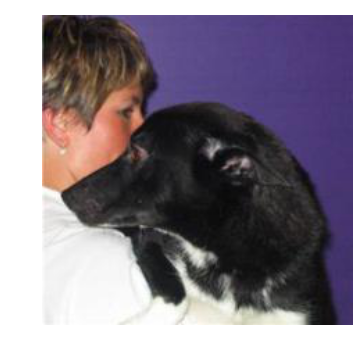

In [5]:
#Prediction for random traffic sign from internet
import random
import scipy 
from scipy import ndimage
from collections import namedtuple

Batch = namedtuple('Batch', ['data'])

def get_image(url, show=False):
    img = np.array(ndimage.imread(url, flatten=False))
    if img is None:
         return None
    if show:
         plt.imshow(img)
         plt.axis('off')
    img = scipy.misc.imresize(img, size=(num_px, num_px))
    img = np.transpose(img, (2, 0, 1))
    img = img[np.newaxis, :]
    return img

def predict(url):
    img = get_image(url, show=True)
    mod.forward(Batch([mx.nd.array(img)]))
    prob = mod.get_outputs()[0].asnumpy()
    prob = np.squeeze(prob)
    print prob
    label = np.argmax(prob)
    print 'dog' if label == 1 else 'cat'

sample_pic = test_files[random.randint(0, len(test_files)-1)]
sample_pic = '00173.jpg'
print sample_pic
predict('test_pad_224x224/' + sample_pic)

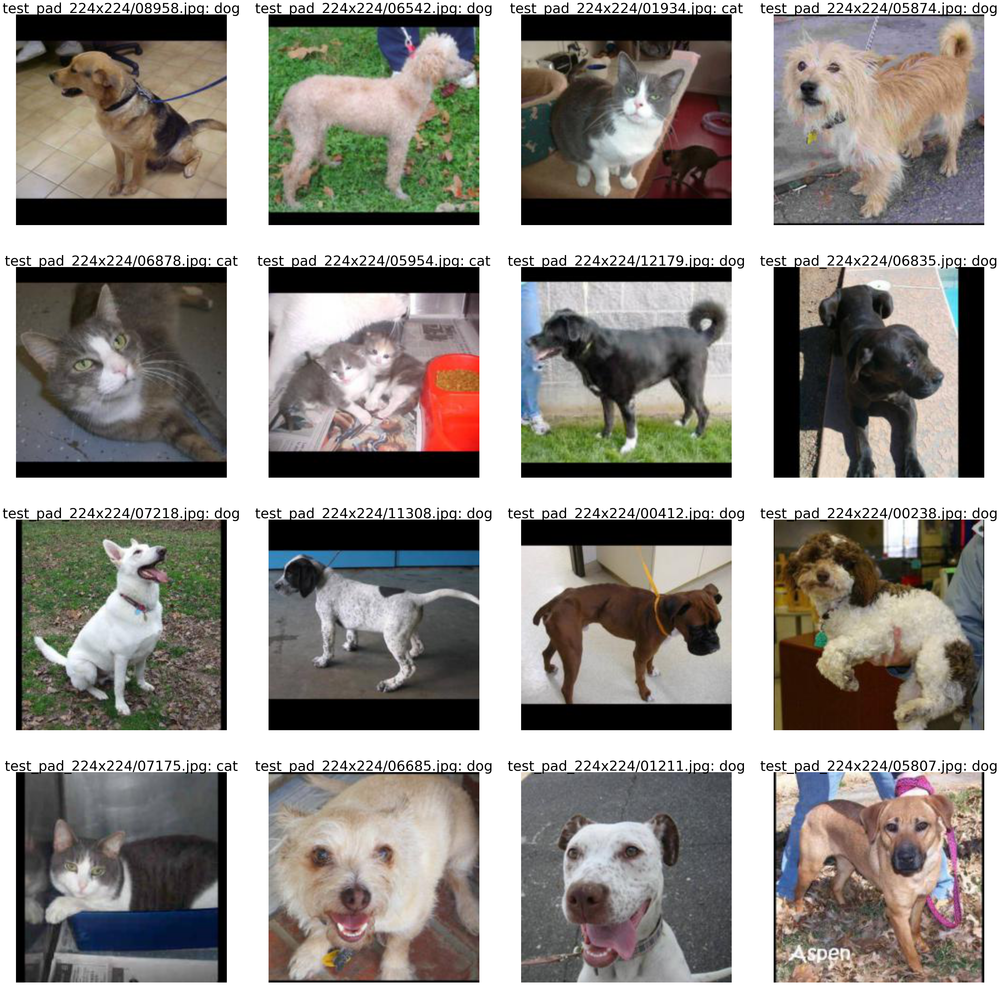

In [8]:
import random
from collections import namedtuple
Batch = namedtuple('Batch', ['data'])

def get_image(url, axis):
    img = np.array(ndimage.imread(url, flatten=False))
    axis.imshow(img)
    axis.axis('off')
    img = scipy.misc.imresize(img, size=(num_px,num_px))
    img = np.transpose(img, (2, 0, 1))
    img = img[np.newaxis, :]
    return img

def predict(url, axis):
    img = get_image(url, axis)
    mod.forward(Batch([mx.nd.array(img)]))
    prob = mod.get_outputs()[0].asnumpy()
    prob = np.squeeze(prob)
    label = np.argmax(prob)
    axis.set_title('%s: %s' % (url, 'dog' if label == 1 else 'cat'), fontsize=40)

fig, axises = plt.subplots(4, 4, figsize=(50, 50))
for i in range(4):
    for j in range(4):
        sample_pic = test_files[random.randint(0, len(test_files)-1)]
        predict('test_pad_224x224/' + sample_pic, axises[i, j])